## Imports


In [1]:
from pathlib import Path
from typing import List

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.io as pio
import seaborn as sns
import torch
import xgboost as xgb
from PIL import Image
from numpy.typing import NDArray
from sklearn import cluster
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import f1_score, accuracy_score
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from tqdm import tqdm
from transformers import AutoImageProcessor, AutoModel
from umap import UMAP
import random

import warnings
warnings.filterwarnings('ignore')

In [2]:
def project_vectors(data: NDArray, technique: str = "tsne", **options) -> NDArray:
    if technique == "pca":
        transformer = PCA(**options)
    elif technique == "tsne":
        transformer = TSNE(**options)
    elif technique == "umap":
        transformer = UMAP(**options)
    else:
        raise ValueError(
            f"Invalid technique: {technique}. Choose from 'pca', 'tsne', or 'umap'."
        )

    transformed_data = transformer.fit_transform(data)
    return transformed_data

In [3]:
pio.renderers.default = "notebook"
print(torch.cuda.is_available())

False


# Dataset Preparation and Object Detection Training

The dataset used for this project was **scraped and collected from the web** using **three different techniques**:

- 📷 **Screenshots** from **Google Maps**.
- 🎞️ **Video frames** extracted from various videos.
- 📱 **Images** captured by **different phones**.

This diverse data collection ensured a wide variety of real-world conditions and perspectives.

---

# Initial Labeling with Grounding DINO

For the first stage of automatic annotation, I utilized [**Grounding DINO**](https://huggingface.co/docs/transformers/main/en/model_doc/grounding-dino), a strong object detection model that can detect objects with **zero-shot** or **few-shot** supervision.  
This greatly helped **bootstrap the labeling** process, making manual work faster and more accurate.

---

# Training YOLO for Improved Detection

After initial annotations, I selected **YOLO** (You Only Look Once) for further model training.  
According to [**Papers with Code**](https://paperswithcode.com/task/object-detection), YOLO consistently ranks among the **best models for object detection**, offering a strong balance between speed and accuracy.

I trained a YOLO model on the dataset, which then helped **refine and assist annotations** inside [**CVAT**](https://app.cvat.ai/tasks/858171?page=1) (Computer Vision Annotation Tool).  
Using CVAT allowed efficient manual corrections, ensuring **high-quality ground truth labels** for the dataset.

---

# Summary

**Workflow**:

> Dataset collection → Initial Grounding DINO labels → YOLO training → CVAT-assisted fine annotation

This hybrid semi-automated + manual approach dramatically accelerated dataset preparation, leading to a robust set of labeled images for object detection tasks.


In [4]:
dataset_path = r"C:/Users/miknowak/Desktop/Studia/DM/Project1/NamedSignboards"

path = Path(dataset_path)
if not path.exists():
    raise FileNotFoundError(f"The dataset directory {dataset_path} does not exist.")

print(f"Path to dataset files: {path}")

Path to dataset files: C:\Users\miknowak\Desktop\Studia\DM\Project1\NamedSignboards


In [5]:
paths_to_images = list(path.glob("**/*.png"))
print("Number of images:", len(paths_to_images))
assert len(paths_to_images) > 0, "No images found in the dataset."

Number of images: 5592


In [6]:
path_df = pd.DataFrame(paths_to_images, columns=["path"])
path_df['class'] = path_df['path'].apply(lambda x: x.stem.split('_')[0])
path_df['class'] = path_df['class'].astype("category")
path_df = path_df.reset_index(drop=True)
print(path_df)

                                                   path  class
0     C:\Users\miknowak\Desktop\Studia\DM\Project1\N...  5ASEC
1     C:\Users\miknowak\Desktop\Studia\DM\Project1\N...  5ASEC
2     C:\Users\miknowak\Desktop\Studia\DM\Project1\N...  5ASEC
3     C:\Users\miknowak\Desktop\Studia\DM\Project1\N...  5ASEC
4     C:\Users\miknowak\Desktop\Studia\DM\Project1\N...  5ASEC
...                                                 ...    ...
5587  C:\Users\miknowak\Desktop\Studia\DM\Project1\N...  ZIAJA
5588  C:\Users\miknowak\Desktop\Studia\DM\Project1\N...  ZIAJA
5589  C:\Users\miknowak\Desktop\Studia\DM\Project1\N...  ZIAJA
5590  C:\Users\miknowak\Desktop\Studia\DM\Project1\N...  ZIAJA
5591  C:\Users\miknowak\Desktop\Studia\DM\Project1\N...  ZIAJA

[5592 rows x 2 columns]


In [7]:
def generate_image_embeddings_with_parseq(
    image_paths: list[str | Path],
    model_name: str = "baudm/parseq-tiny",
    batch_size: int = 1
) -> np.ndarray:
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print("Using device:", device)

    model = torch.hub.load('baudm/parseq', 'parseq', source='github', pretrained=True).to(device).eval()
    from strhub.data.module import SceneTextDataModule # type: ignore
    img_transform = SceneTextDataModule.get_transform(model.hparams.img_size)

    all_embeddings = []

    for i in range(0, len(image_paths), batch_size):
        batch_paths = image_paths[i:i + batch_size]
        images = [img_transform(Image.open(path).convert("RGB")) for path in batch_paths]
        images = torch.stack(images).to(device)

        with torch.no_grad():
            embeddings = model.model.encode(images)
            if embeddings.dim() == 3:
                embeddings = embeddings.mean(dim=1)
            embeddings = embeddings.cpu().numpy()

        all_embeddings.append(embeddings)

    return np.vstack(all_embeddings).squeeze()

embeddings_parseq = generate_image_embeddings_with_parseq(path_df.path.tolist(), batch_size=16, model_name="baudm/parseq")


Using device: cpu


Using cache found in C:\Users\miknowak/.cache\torch\hub\baudm_parseq_main


In [8]:
embeddings_parseq.shape

(5592, 384)

In [9]:
def generate_image_embeddings_as_histograms(image_paths: list[str | Path]):
    histograms = []
    for image_path in tqdm(image_paths):
        image = Image.open(image_path)
        image = image.resize((224, 224))

        # Convert image to numpy array
        image = np.array(image)

        # Create histogram
        histogram, _ = np.histogram(image, bins=256, range=(0, 256))
        histograms.append(histogram)

    return np.vstack(histograms).squeeze()


embeddings_histogram = generate_image_embeddings_as_histograms(path_df.path.tolist())

100%|██████████| 5592/5592 [00:36<00:00, 153.65it/s]


In [10]:
def plot_embeddings(embeddings: NDArray,
                    additional_columns: dict[str, list[any]] = None,
                    map_columns_as_categories: list[str] = None,
                    reduce_technique: str = "tsne",
                    symbol: str = None,
                    color: str = None,
                    hover_data: list[str] = None,
                    plot_3d: bool = False
                    ):
    if additional_columns is None:
        additional_columns = {}

    for column_name, column_data in additional_columns.items():
        if len(column_data) != embeddings.shape[0]:
            raise ValueError(f"Length of column data for '{column_name}' does not match number of embeddings.")

    for on_hover_column_name in hover_data:
        if on_hover_column_name not in additional_columns:
            raise ValueError(f"Column '{on_hover_column_name}' not found in additional columns.")

    
    if embeddings.shape[1] > 2:
        reduced_embeddings = project_vectors(embeddings, technique=reduce_technique,
                                             n_components=3 if plot_3d else 2, random_state=6)
        print(f"Reduced embeddings from {embeddings.shape[1]} to {reduced_embeddings.shape[1]}")
    else:
        reduced_embeddings = embeddings
        
    df = pd.DataFrame({
        "x": reduced_embeddings[:, 0],
        "y": reduced_embeddings[:, 1],

        "z": reduced_embeddings[:, 2] if plot_3d else None,

        **additional_columns
    })

    df = df.astype(
        {col: "category" for col in df.select_dtypes(include=["object", "category"]).columns}
    )
    
    
    
    if map_columns_as_categories is not None:
        df = df.astype(
            {col: "category" for col in map_columns_as_categories}
        )

    if plot_3d:
        fig = px.scatter_3d(df, x="x", y="y", z="z", color=color, symbol=symbol,
                            title=f"{reduce_technique} reduction technique. Visualization of Image Embeddings",
                            hover_data=hover_data)
    else:
        fig = px.scatter(df, x="x", y="y", color=color, symbol=symbol,
                         title=f"{reduce_technique} reduction technique. Visualization of Image Embeddings",
                         hover_data=hover_data
                         
                         
                         )

    fig.update_traces(textfont_size=25, marker=dict(size=25))
    fig.update_layout(template="plotly")
    fig.show()

In [11]:
plot_embeddings(embeddings_parseq,
                additional_columns={
                    "class": path_df["class"].tolist(),
                    "path": list(map(lambda d: str(d), path_df["path"].tolist())),
                },
                color="class",
                hover_data=["path", "class"],
                plot_3d=False,
                reduce_technique="tsne"
                )

Reduced embeddings from 384 to 2


In [12]:
plot_embeddings(embeddings_histogram,
                additional_columns={
                    "class": path_df["class"].tolist(),
                    "path": list(map(lambda d: str(d), path_df["path"].tolist())),
                },
                color="class",
                hover_data=["path", "class"],
                plot_3d=False,
                reduce_technique="tsne"
                )

Reduced embeddings from 256 to 2


In [13]:
# Convert labels to numerical values
unique_labels = path_df["class"].unique()
# print("Unique labels:", unique_labels)
label_mapping  = {label: idx for idx, label in enumerate(unique_labels)}
labels = path_df["class"].map(label_mapping)
reverse_label_mapping = { value:key for key, value in label_mapping.items()}
label_mapping

{'5ASEC': 0,
 'ABELLE': 1,
 'ABFOTO': 2,
 'ABLIKLE': 3,
 'ACTIVUS': 4,
 'ADLOVINGHOME': 5,
 'AGIO': 6,
 'AMERICANCANDLE': 7,
 'APART': 8,
 'APPLE': 9,
 'AQUAELZOO': 10,
 'ARYTON': 11,
 'AX': 12,
 'BARTEK': 13,
 'BB': 14,
 'BERSHKA': 15,
 'BIALCON': 16,
 'BIGSIZE': 17,
 'BIGSTAR': 18,
 'BIJOUBRIGITTE': 19,
 'BONAPETITO': 20,
 'BRICOMARCHE': 21,
 'BURGERKING': 22,
 'BYTOM': 23,
 'C&A': 24,
 'CALYDLAMALYCH': 25,
 'CALZEDONIA': 26,
 'CANAL+': 27,
 'CARREFOUR': 28,
 'CARRY': 29,
 'CARTEDOR': 30,
 'CASTELLARI': 31,
 'CCC': 32,
 'CEZAR': 33,
 'CHANGE': 34,
 'CHIARA': 35,
 'CHRONO': 36,
 'CIASTA': 37,
 'CIESLIKOWSKI': 38,
 'CINEMACITY': 39,
 'CINNAMON': 40,
 'CLAIRES': 41,
 'CLARESA': 42,
 'CLARKS': 43,
 'CORALTRAVEL': 44,
 'COSTACOFFEE': 45,
 'COS': 46,
 'CROPP': 47,
 'CUBUS': 48,
 'CUKIERNIAKRAKOWSKIEWYPIEKI': 49,
 'CUKIERNIASOWA': 50,
 'CZASNAHERBATE': 51,
 'C': 52,
 'DANHEN': 53,
 'DEALZ': 54,
 'DEICHMANN': 55,
 'DELUCA': 56,
 'DENON': 57,
 'DIVERSE': 58,
 'DOMINIUM': 59,
 'DOUGLAS': 60,
 

## Classifiers


In [14]:
def plot_confusion_matrix_with_bucketing(cm, title="Confusion Matrix", n_groups=10):
    """
    Plots a confusion matrix, optionally bucketing classes into a fixed number of groups.
    """
    num_classes = cm.shape[0]
    group_size = int(np.ceil(num_classes / n_groups))  # How many classes per group

    if num_classes <= n_groups:
        # If very few classes, no bucketing needed
        grouped_cm = cm
        group_labels = list(map(str, range(num_classes)))
    else:
        # Create group index boundaries
        boundaries = [i * group_size for i in range(n_groups)]
        boundaries.append(num_classes)  # ensure we cover the last classes

        # Initialize grouped confusion matrix
        grouped_cm = np.zeros((n_groups, n_groups), dtype=int)

        for i in range(n_groups):
            for j in range(n_groups):
                grouped_cm[i, j] = cm[boundaries[i]:boundaries[i+1], boundaries[j]:boundaries[j+1]].sum()

        # Create group labels
        group_labels = []
        for i in range(n_groups):
            start = boundaries[i] + 1
            end = boundaries[i+1]
            group_labels.append(f"{start}-{end}")

    plt.figure(figsize=(10, 8))
    sns.heatmap(grouped_cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=group_labels, yticklabels=group_labels)
    plt.xlabel('Predicted Label (Grouped)')
    plt.ylabel('True Label (Grouped)')
    plt.title(title)
    plt.show()

In [15]:
def train_and_evaluate_xgb(X, y, title="XGBoost Classifier", visualize_example=True):
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, stratify=y, shuffle=True, random_state=42
    )

    print(f"\n=== {title} ===")
    print(f"Training data shape: {X_train.shape}")
    print(f"Testing data shape: {X_test.shape}")

    xgb_clf = xgb.XGBClassifier(
        n_estimators=100,
        max_depth=5,
        learning_rate=0.1,
        objective='multi:softprob', 
        eval_metric='mlogloss',
        random_state=42
    )

    xgb_clf.fit(X_train, y_train)
    y_pred = xgb_clf.predict(X_test)

    f1 = f1_score(y_test, y_pred, average='macro')
    acc = accuracy_score(y_test, y_pred)

    print(f"F1 Score: {f1:.4f}")
    print(f"Accuracy: {acc:.4f}")

    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))

    cm = confusion_matrix(y_test, y_pred)

    try:
        plot_confusion_matrix_with_bucketing(cm, title=f"Confusion Matrix ({title})")
    except Exception as e:
        print(f"Could not plot confusion matrix with bucketing: {e}")
        # fallback
        plt.figure(figsize=(10, 8))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')
        plt.title(f'Confusion Matrix ({title})')
        plt.show()

    # -----------------------------------
    # Visualize One Example Prediction
    # -----------------------------------
    if visualize_example:
        example_idx = random.choice(range(len(X)))
        example_image_path = path_df.iloc[example_idx]["path"]
        example_image_embedding = X[example_idx]

        print("\n=== Example Prediction ===")
        print("Embedding shape:", example_image_embedding.shape)
        example_image_embedding = example_image_embedding.reshape(1, -1)
        print("After adding batch dimension:", example_image_embedding.shape)

        y_pred_example = xgb_clf.predict(example_image_embedding)
        print("Predicted class idx:", y_pred_example[0])
        print("Predicted class name:", reverse_label_mapping[y_pred_example[0].item()])

        display(Image.open(example_image_path))


In [16]:
def train_and_evaluate_knn(X, y, title="KNN Classifier", n_neighbors=5, visualize_example=True):
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, stratify=y, shuffle=True, random_state=42
    )

    print(f"\n=== {title} ===")
    print(f"Training data shape: {X_train.shape}")
    print(f"Testing data shape: {X_test.shape}")

    knn_clf = KNeighborsClassifier(n_neighbors=n_neighbors)
    knn_clf.fit(X_train, y_train)
    y_pred = knn_clf.predict(X_test)

    f1 = f1_score(y_test, y_pred, average='macro')
    acc = accuracy_score(y_test, y_pred)

    print(f"F1 Score: {f1:.4f}")
    print(f"Accuracy: {acc:.4f}")

    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))

    cm = confusion_matrix(y_test, y_pred)

    try:
        plot_confusion_matrix_with_bucketing(cm, title=f"Confusion Matrix ({title})")
    except Exception as e:
        print(f"Could not plot confusion matrix with bucketing: {e}")
        # fallback
        plt.figure(figsize=(10, 8))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')
        plt.title(f'Confusion Matrix ({title})')
        plt.show()

    # -----------------------------------
    # Visualize One Example Prediction
    # -----------------------------------
    if visualize_example:
        example_idx = random.choice(range(len(X)))
        example_image_path = path_df.iloc[example_idx]["path"]
        example_image_embedding = X[example_idx]

        print("\n=== Example Prediction ===")
        print("Embedding shape:", example_image_embedding.shape)
        example_image_embedding = example_image_embedding.reshape(1, -1)
        print("After adding batch dimension:", example_image_embedding.shape)

        y_pred_example = knn_clf.predict(example_image_embedding)
        print("Predicted class idx:", y_pred_example[0])
        print("Predicted class name:", reverse_label_mapping[y_pred_example[0].item()])

        display(Image.open(example_image_path))

    return f1, acc


## Dimensionality Reduction


PC1: 0.1077 (0.1077 cumulative)
PC2: 0.0854 (0.1931 cumulative)
PC3: 0.0578 (0.2509 cumulative)
PC4: 0.0470 (0.2978 cumulative)
PC5: 0.0362 (0.3340 cumulative)
PC6: 0.0310 (0.3650 cumulative)
PC7: 0.0291 (0.3941 cumulative)
PC8: 0.0259 (0.4199 cumulative)
PC9: 0.0231 (0.4430 cumulative)
PC10: 0.0217 (0.4647 cumulative)
PC11: 0.0206 (0.4854 cumulative)
PC12: 0.0183 (0.5036 cumulative)
PC13: 0.0181 (0.5217 cumulative)
PC14: 0.0166 (0.5384 cumulative)
PC15: 0.0154 (0.5538 cumulative)
PC16: 0.0143 (0.5681 cumulative)
PC17: 0.0137 (0.5818 cumulative)
PC18: 0.0130 (0.5949 cumulative)
PC19: 0.0128 (0.6076 cumulative)
PC20: 0.0119 (0.6195 cumulative)
PC21: 0.0112 (0.6307 cumulative)
PC22: 0.0110 (0.6418 cumulative)
PC23: 0.0103 (0.6521 cumulative)
PC24: 0.0097 (0.6618 cumulative)
PC25: 0.0092 (0.6710 cumulative)
PC26: 0.0089 (0.6799 cumulative)
PC27: 0.0087 (0.6886 cumulative)
PC28: 0.0084 (0.6970 cumulative)
PC29: 0.0079 (0.7049 cumulative)
PC30: 0.0076 (0.7124 cumulative)
PC31: 0.0072 (0.719

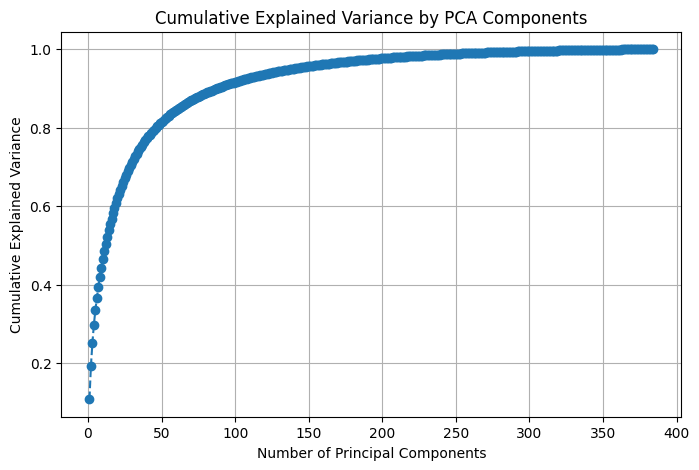

In [17]:
pca = PCA()
X_pca = pca.fit_transform(embeddings_parseq)

# Step 3: Variance explained by each component
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Print results
for i, (ev, cum) in enumerate(zip(explained_variance_ratio, cumulative_variance)):
    print(f"PC{i+1}: {ev:.4f} ({cum:.4f} cumulative)")

# Optional: Plot variance explained
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(explained_variance_ratio) + 1), cumulative_variance, marker='o', linestyle='--')
plt.title('Cumulative Explained Variance by PCA Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

In [18]:
reduced_embeddings = project_vectors(embeddings_parseq, technique="pca", n_components=50, random_state=6)

## KNN classifier on whole embeddings



=== KNN - Full Embeddings ===
Training data shape: (3914, 384)
Testing data shape: (1678, 384)
F1 Score: 0.9247
Accuracy: 0.9338

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       1.00      1.00      1.00         2
           2       1.00      1.00      1.00         2
           3       1.00      1.00      1.00         2
           4       1.00      1.00      1.00         5
           5       0.60      1.00      0.75         3
           6       0.75      0.75      0.75         4
           7       1.00      1.00      1.00         3
           8       0.72      1.00      0.84        29
           9       0.67      1.00      0.80         4
          10       1.00      1.00      1.00         2
          11       1.00      1.00      1.00         2
          12       0.75      1.00      0.86         3
          13       1.00      1.00      1.00         2
          14       1.00      0.50  

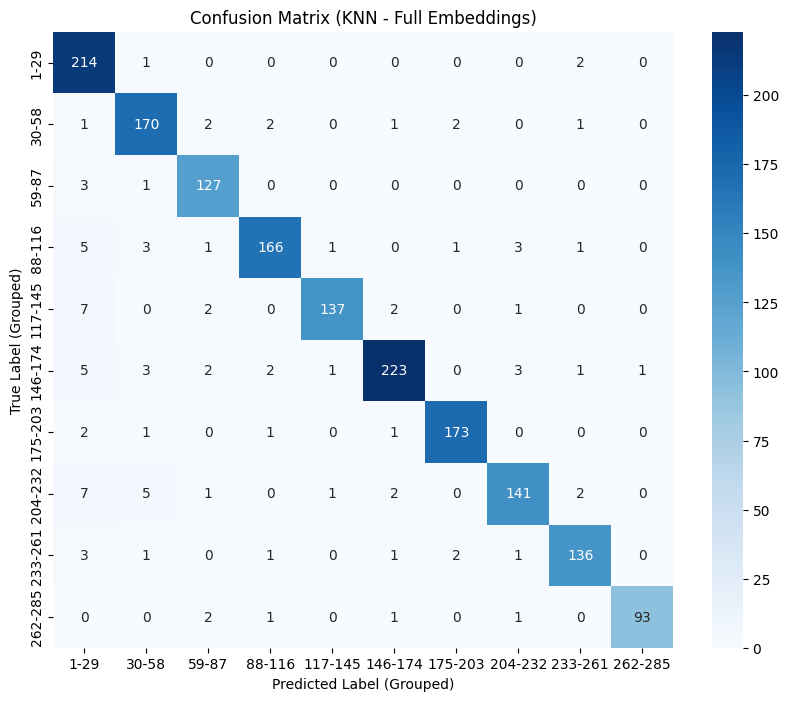


=== Example Prediction ===
Embedding shape: (384,)
After adding batch dimension: (1, 384)
Predicted class idx: 77
Predicted class name: FIELMANN


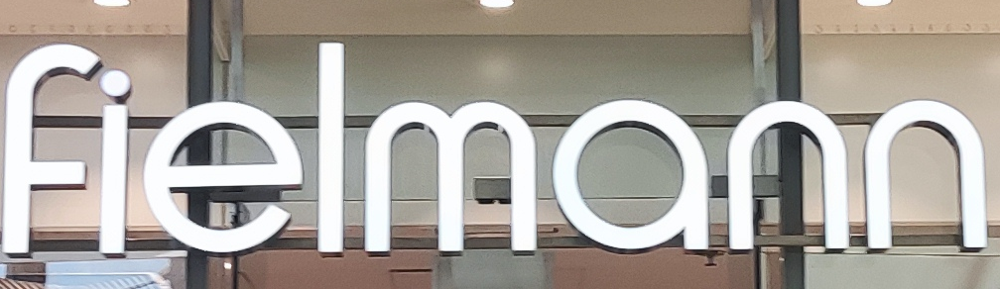

(0.924685297166968, 0.933849821215733)

In [19]:
train_and_evaluate_knn(embeddings_parseq, labels, title="KNN - Full Embeddings")

## KNN classifier on reduced embeddings



=== KNN - Reduced Embeddings ===
Training data shape: (3914, 50)
Testing data shape: (1678, 50)
F1 Score: 0.9075
Accuracy: 0.9190

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       1.00      1.00      1.00         2
           2       1.00      1.00      1.00         2
           3       1.00      1.00      1.00         2
           4       1.00      1.00      1.00         5
           5       0.50      1.00      0.67         3
           6       1.00      0.75      0.86         4
           7       1.00      1.00      1.00         3
           8       0.81      1.00      0.89        29
           9       0.80      1.00      0.89         4
          10       1.00      1.00      1.00         2
          11       1.00      1.00      1.00         2
          12       0.40      0.67      0.50         3
          13       1.00      1.00      1.00         2
          14       1.00      0.50 

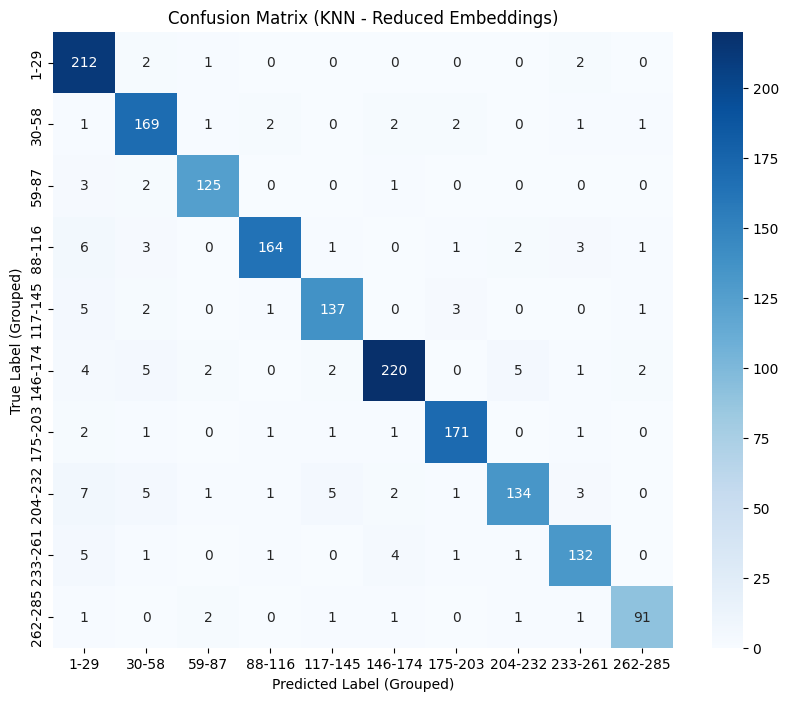


=== Example Prediction ===
Embedding shape: (50,)
After adding batch dimension: (1, 50)
Predicted class idx: 203
Predicted class name: RTVEURO


(0.9075283534205072, 0.9189511323003575)

In [20]:
train_and_evaluate_knn(reduced_embeddings, labels, title="KNN - Reduced Embeddings")

## XGB-boost classifier on whole embeddings



=== XGB - Full Embeddings ===
Training data shape: (3914, 384)
Testing data shape: (1678, 384)
F1 Score: 0.8912
Accuracy: 0.9130

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       1.00      1.00      1.00         2
           2       1.00      1.00      1.00         2
           3       1.00      1.00      1.00         2
           4       1.00      1.00      1.00         5
           5       0.75      1.00      0.86         3
           6       1.00      0.75      0.86         4
           7       1.00      1.00      1.00         3
           8       1.00      0.97      0.98        29
           9       1.00      0.75      0.86         4
          10       1.00      0.50      0.67         2
          11       1.00      1.00      1.00         2
          12       1.00      1.00      1.00         3
          13       1.00      1.00      1.00         2
          14       1.00      0.50  

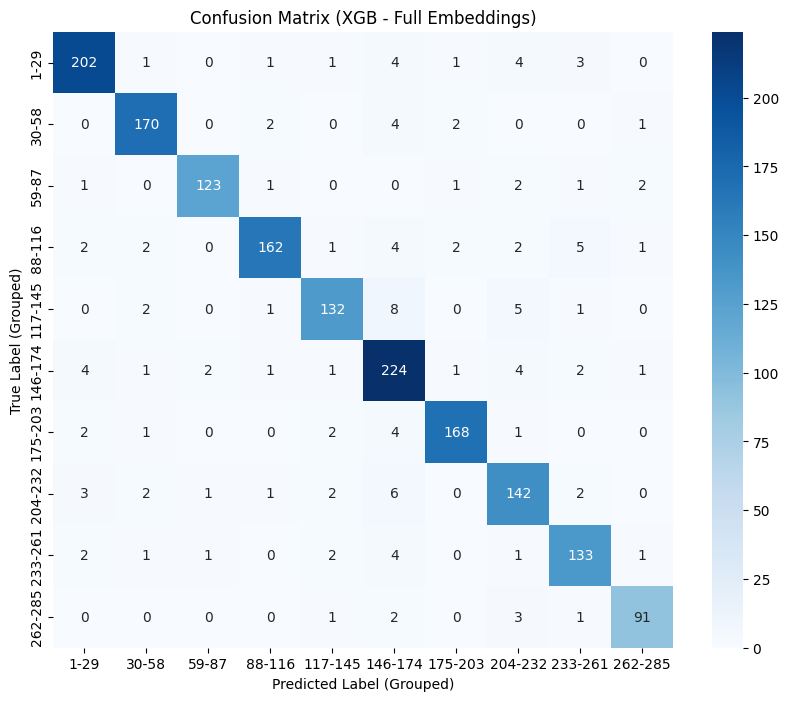


=== Example Prediction ===
Embedding shape: (384,)
After adding batch dimension: (1, 384)
Predicted class idx: 146
Predicted class name: MCDONALDS


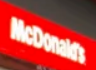

In [21]:
train_and_evaluate_xgb(embeddings_parseq, labels, title="XGB - Full Embeddings")

## XGB-boost classifier on reduced embeddings



=== XGB - Reduced Embeddings ===
Training data shape: (3914, 50)
Testing data shape: (1678, 50)
F1 Score: 0.8399
Accuracy: 0.8802

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       1.00      1.00      1.00         2
           2       1.00      1.00      1.00         2
           3       1.00      1.00      1.00         2
           4       0.67      0.40      0.50         5
           5       1.00      0.67      0.80         3
           6       0.60      0.75      0.67         4
           7       1.00      1.00      1.00         3
           8       1.00      1.00      1.00        29
           9       1.00      0.25      0.40         4
          10       1.00      1.00      1.00         2
          11       1.00      1.00      1.00         2
          12       1.00      0.67      0.80         3
          13       1.00      1.00      1.00         2
          14       0.00      0.00 

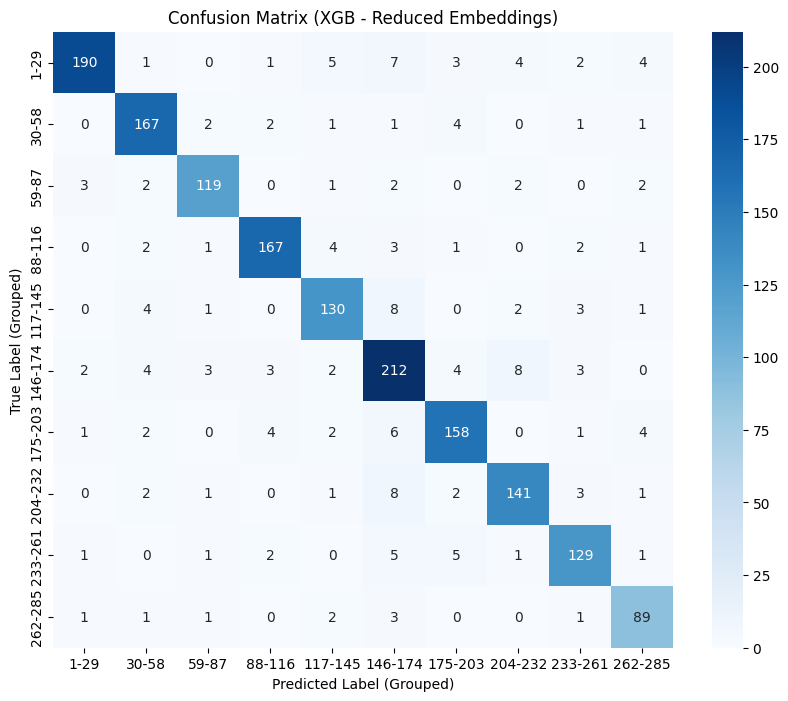


=== Example Prediction ===
Embedding shape: (50,)
After adding batch dimension: (1, 50)
Predicted class idx: 199
Predicted class name: RESERVED


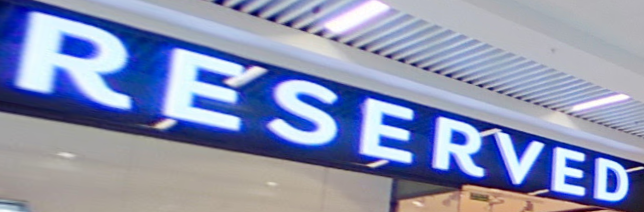

In [22]:
train_and_evaluate_xgb(reduced_embeddings, labels, title="XGB - Reduced Embeddings")

## Clustering


In [23]:
def cluster_embeddings(embeddings: NDArray, algorithm_name: str = 'KMeans', **kwargs):
    """
    Clusters embeddings using a specified clustering algorithm from sklearn.
    
    Parameters:
    -----------
    embeddings : numpy.ndarray
        The embeddings to cluster, shape (n_samples, n_features)
    algorithm_name : str
        Name of the clustering algorithm to use (must be available in sklearn.cluster
        or be GaussianMixture)
    **kwargs : 
        Additional parameters to pass to the clustering algorithm
        
    Returns:
    --------
    labels : numpy.ndarray
        Cluster labels for each embedding, shape (n_samples,)
    model : object
        The fitted clustering model
    """
    if not isinstance(embeddings, np.ndarray):
        raise TypeError("Embeddings must be a numpy array")

    if len(embeddings.shape) != 2:
        raise ValueError(f"Embeddings must be 2D array, got shape {embeddings.shape}")

    if algorithm_name == 'GaussianMixture':
        algorithm_class = GaussianMixture
    else:
        try:
            algorithm_class = getattr(cluster, algorithm_name)
        except AttributeError:
            raise ValueError(f"Algorithm '{algorithm_name}' not found in sklearn.cluster or is not GaussianMixture")

    model = algorithm_class(**kwargs)

    if hasattr(model, 'fit_predict'):
        labels = model.fit_predict(embeddings)
    elif hasattr(model, 'fit') and hasattr(model, 'predict'):

        model.fit(embeddings)
        labels = model.predict(embeddings)
    else:
        raise ValueError(f"Algorithm '{algorithm_name}' does not support required methods")

    return labels, model


## K-means on whole embeddings


In [24]:
clustering_results, model1 = cluster_embeddings(embeddings_parseq, 'KMeans', n_clusters=7)
print(f"KMeans labels shape: {clustering_results.shape}, unique clusters: {np.unique(clustering_results)}")
print(f"ARI: {adjusted_rand_score(clustering_results, labels)}")

plot_embeddings(embeddings_parseq,
                additional_columns={
                    "class": path_df["class"].tolist(),
                    "path": list(map(str, path_df["path"].tolist())),
                    # "path": path_df["path"].tolist(),
                    "cluster": clustering_results.tolist()
                },
                color="cluster",
                symbol="class",
                hover_data=["path"],
                map_columns_as_categories=["cluster"]
                )

KMeans labels shape: (5592,), unique clusters: [0 1 2 3 4 5 6]
ARI: 0.032538238748344085
Reduced embeddings from 384 to 2


## K-means on reduced embeddings


In [25]:
clustering_results2, model2 = cluster_embeddings(reduced_embeddings, 'KMeans', n_clusters=7)
print(f"KMeans labels shape: {clustering_results2.shape}, unique clusters: {np.unique(clustering_results2)}")
print(f"ARI: {adjusted_rand_score(clustering_results2, labels)}")

plot_embeddings(reduced_embeddings,
                additional_columns={
                    "class": path_df["class"].tolist(),
                    "path": list(map(str, path_df["path"].tolist())),
                    # "path": path_df["path"].tolist(),
                    "cluster": clustering_results2.tolist()
                },
                color="cluster",
                symbol="class",
                hover_data=["path"],
                map_columns_as_categories=["cluster"]
                )

KMeans labels shape: (5592,), unique clusters: [0 1 2 3 4 5 6]
ARI: 0.03045419163413943
Reduced embeddings from 50 to 2


## DBSCAN on whole embeddings


In [26]:
clustering_results_dbscan, model_dbscan = cluster_embeddings(
    embeddings_parseq,
    'DBSCAN',
    eps=0.5,
    min_samples=5
)

print(f"DBSCAN labels shape: {clustering_results_dbscan.shape}, unique clusters: {np.unique(clustering_results_dbscan)}")
print(f"ARI: {adjusted_rand_score(clustering_results_dbscan, labels)}")

plot_embeddings(
    embeddings_parseq,
    additional_columns={
        "class": path_df["class"].tolist(),
        "path": list(map(str, path_df["path"].tolist())),
        "cluster": clustering_results_dbscan.tolist()
    },
    color="cluster",
    symbol="class",
    hover_data=["path"],
    map_columns_as_categories=["cluster"]
)

DBSCAN labels shape: (5592,), unique clusters: [ -1   0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16
  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34
  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52
  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70
  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88
  89  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106
 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124
 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142
 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160
 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178
 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196
 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214]
ARI: 0.0019055771979904939
Reduced embeddings from 384 to 2


## DBSCAN on reduced embeddings


In [27]:
clustering_results_dbscan2, model_dbscan2 = cluster_embeddings(
    reduced_embeddings,
    'DBSCAN',
    eps=0.5,
    min_samples=5
)

print(f"DBSCAN labels shape: {clustering_results_dbscan2.shape}, unique clusters: {np.unique(clustering_results_dbscan2)}")
print(f"ARI: {adjusted_rand_score(clustering_results_dbscan2, labels)}")

plot_embeddings(
    reduced_embeddings,
    additional_columns={
        "class": path_df["class"].tolist(),
        "path": list(map(str, path_df["path"].tolist())),
        "cluster": clustering_results_dbscan2.tolist()
    },
    color="cluster",
    symbol="class",
    hover_data=["path"],
    map_columns_as_categories=["cluster"]
)


DBSCAN labels shape: (5592,), unique clusters: [ -1   0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16
  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34
  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52
  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70
  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88
  89  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106
 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124
 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142
 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160
 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178
 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196
 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214
 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232
 233